# Self-Driving Car Engineer Nanodegree


## Project: **Finding Lane Lines on the Road** 
***
In this project, you will use the tools you learned about in the lesson to identify lane lines on the road.  You can develop your pipeline on a series of individual images, and later apply the result to a video stream (really just a series of images). Check out the video clip "raw-lines-example.mp4" (also contained in this repository) to see what the output should look like after using the helper functions below. 

Once you have a result that looks roughly like "raw-lines-example.mp4", you'll need to get creative and try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines.  You can see an example of the result you're going for in the video "P1_example.mp4".  Ultimately, you would like to draw just one line for the left side of the lane, and one for the right.

In addition to implementing code, there is a brief writeup to complete. The writeup should be completed in a separate file, which can be either a markdown file or a pdf document. There is a [write up template](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) that can be used to guide the writing process. Completing both the code in the Ipython notebook and the writeup template will cover all of the [rubric points](https://review.udacity.com/#!/rubrics/322/view) for this project.

---
Let's have a look at our first image called 'test_images/solidWhiteRight.jpg'.  Run the 2 cells below (hit Shift-Enter or the "play" button above) to display the image.

**Note: If, at any point, you encounter frozen display windows or other confounding issues, you can always start again with a clean slate by going to the "Kernel" menu above and selecting "Restart & Clear Output".**

---

**The tools you have are color selection, region of interest selection, grayscaling, Gaussian smoothing, Canny Edge Detection and Hough Tranform line detection.  You  are also free to explore and try other techniques that were not presented in the lesson.  Your goal is piece together a pipeline to detect the line segments in the image, then average/extrapolate them and draw them onto the image for display (as below).  Once you have a working pipeline, try it out on the video stream below.**

---

<figure>
 <img src="examples/line-segments-example.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your output should look something like this (above) after detecting line segments using the helper functions below </p> 
 </figcaption>
</figure>
 <p></p> 
<figure>
 <img src="examples/laneLines_thirdPass.jpg" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;"> Your goal is to connect/average/extrapolate line segments to get output like this</p> 
 </figcaption>
</figure>

**Run the cell below to import some packages.  If you get an `import error` for a package you've already installed, try changing your kernel (select the Kernel menu above --> Change Kernel).  Still have problems?  Try relaunching Jupyter Notebook from the terminal prompt.  Also, consult the forums for more troubleshooting tips.**  

## Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## Read in an Image

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


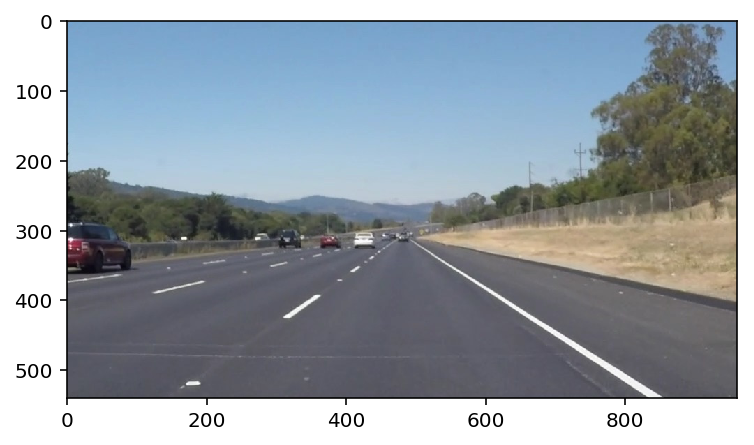

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)  # if you wanted to show a single color channel image called 'gray', for example, call as plt.imshow(gray, cmap='gray')

## Ideas for Lane Detection Pipeline

**Some OpenCV functions (beyond those introduced in the lesson) that might be useful for this project are:**

`cv2.inRange()` for color selection  
`cv2.fillPoly()` for regions selection  
`cv2.line()` to draw lines on an image given endpoints  
`cv2.addWeighted()` to coadd / overlay two images  
`cv2.cvtColor()` to grayscale or change color  
`cv2.imwrite()` to output images to file  
`cv2.bitwise_and()` to apply a mask to an image

**Check out the OpenCV documentation to learn about these and discover even more awesome functionality!**

## Helper Functions

Below are some helper functions to help get you started. They should look familiar from the lesson!

In [3]:
import math

def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
 
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def draw_lines(img, lines, color=[255, 0, 0], thickness=3):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    for line in lines:
        for x1,y1,x2,y2 in line:             
            cv2.line(img, (x1, y1), (x2, y2), color, thickness)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(line_img, lines)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=1, β=0.8, λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

## Test Images

Build your pipeline to work on the images in the directory "test_images"  
**You should make sure your pipeline works well on these images before you try the videos.**

## Creating the image list & output directory
First I create a list of all available images located in the `test_images` folder. If the folder `test_images_output` does not exist I create it so I can save there the edited images at a later stage.

In [4]:
input_image_path = "test_images/"
img_name_list = os.listdir(input_image_path)
output_path = "test_images_output/"
if os.path.exists(output_path) == False:
    os.mkdir(output_path)

## Display and Write images helper function
Below I define a two new helper functions: 
1. `display(imlist)` which displays the images on a given image list `imlist`. This will help during testing of each subsequent step of the pipeline applied to all input images. 
2. `write(imlist,output,path,imname_list,suffix)` which writes the images from the given `imlist` to the `output_path` by combining the given names from the `imname_list` with a predefined `suffix`.

In [5]:
def display(imlist):
    """
    The function displays all images of the given
    `imlist` in a n*2 plot where n is the number of images.
    """
    columns = 2
    rows = (len(imlist)+1)//columns
    
    plt.figure(figsize=(10,11))
    for i, img in enumerate(imlist):
        plt.subplot(rows, columns, i+1)
        # Check if the image is gray scale then plot it as such
        if len(img.shape) == 2:
            cmap = 'gray'
        # Othewise print it with color map
        else:
            cmap = None
        plt.imshow(img, cmap=cmap)
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()
    
def write(imlist,output_path,imname_list, suffix):
    """
    The functions writes all images of the given `imlist`
    to the `output_path` combining the name from the given
    `imname_list` with the input `suffix`.
    """
    for img, filename in zip(imlist, imname_list):
        name, ext = os.path.splitext(filename)
        filename = "{name}_{suffix}{ext}".format(name=name,suffix=suffix,ext=ext)
        cv2.imwrite(os.path.join(output_path,filename),cv2.cvtColor(img, cv2.COLOR_RGB2BGR))

## Load and display test images
I read all the images from the given path and then use the helper function created above to display them. During the implementation of the exercise when I reached the last `challenge` video I had problems detecting the lanes. This was caused by: 
1. The different resolution compared to the rest of the photos and videos
2. Because of the challenges particular conditions (shades, tarmac difference, steeper curve)

On my later iterations on the exercise, to have a feeling how my pipeline is handling the last video, I took also two screenshots from the `challenge` video during the testing phase. I tried to take two screenshots that represent the most tricky situations on detection.

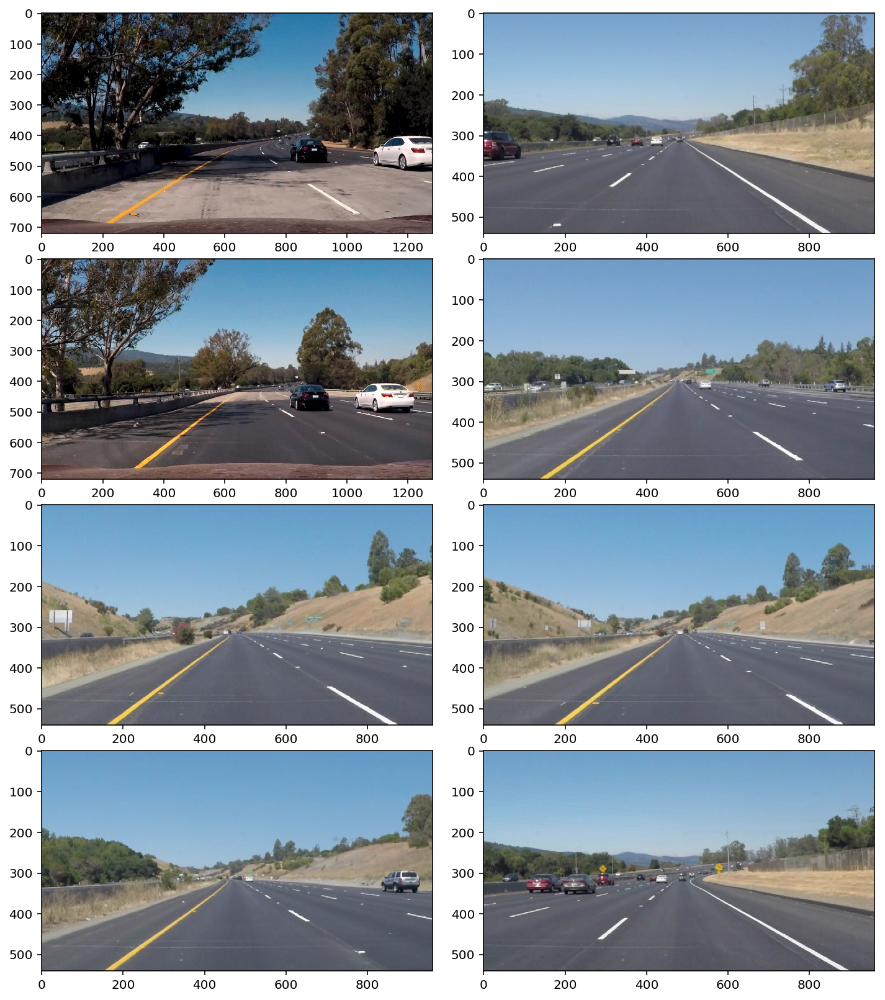

In [8]:
img_list = []
for i, name in enumerate(img_name_list):
    img_list.append(plt.imread(os.path.join(input_image_path,name)))
display(img_list)

## Build a Lane Finding Pipeline



Build the pipeline and run your solution on all test_images. Make copies into the `test_images_output` directory, and you can use the images in your writeup report.

Try tuning the various parameters, especially the low and high Canny thresholds as well as the Hough lines parameters.

In [ ]:
# TODO: Build your pipeline that will draw lane lines on the test_images
# then save them to the test_images directory.

## Grayscale color space
<p>As we see the images contain two different colors of lines **`white`** and **`yellow`**. In order to proceed to a color selection I am going to convert the images to grayscale color space suspecting that the **`yellow`** color will be leaning towards the **`white`** so I can extract afterwards by selecting only one color threshold.</p>
<p>Using the helper function `grayscale` provided above the result is below.</p>

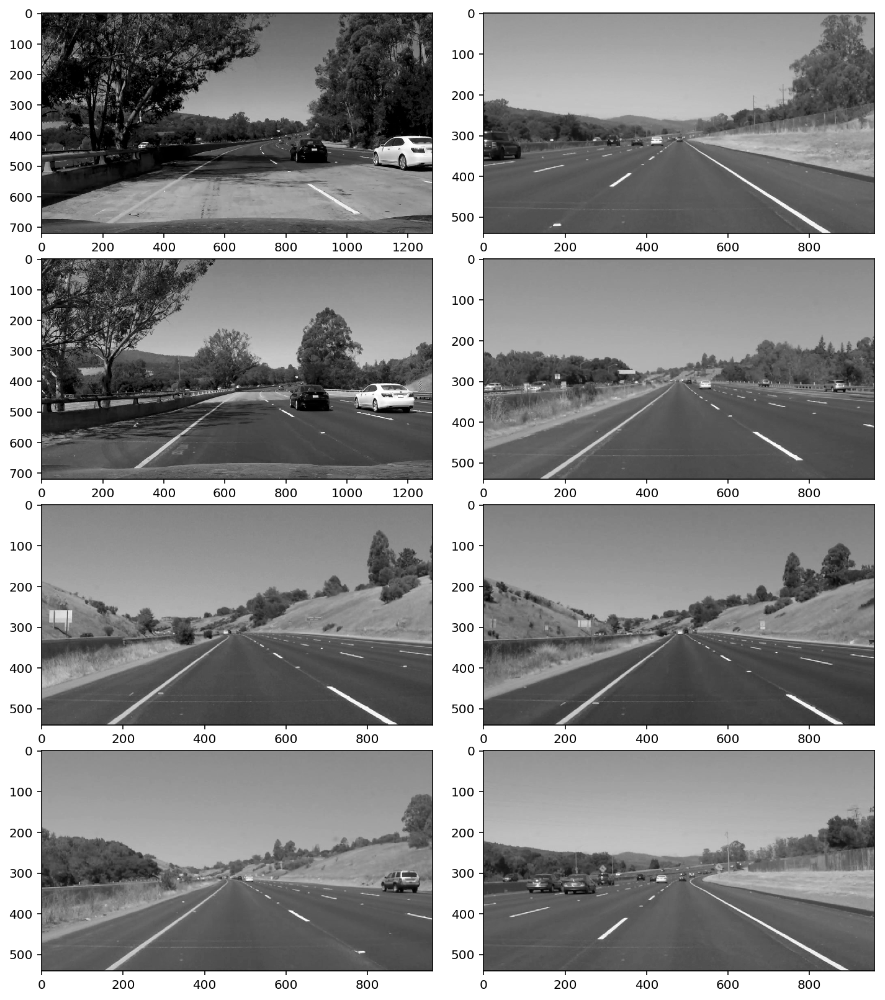

In [9]:
gray_img_list =  list(map(grayscale,img_list))

display(gray_img_list)

## Color selection
Now that it seems that also the `yellow` lines came closer to the `white` color, which I want to get from the image, I can try color selection. Using appropriate thresholds to extract only the lines. 

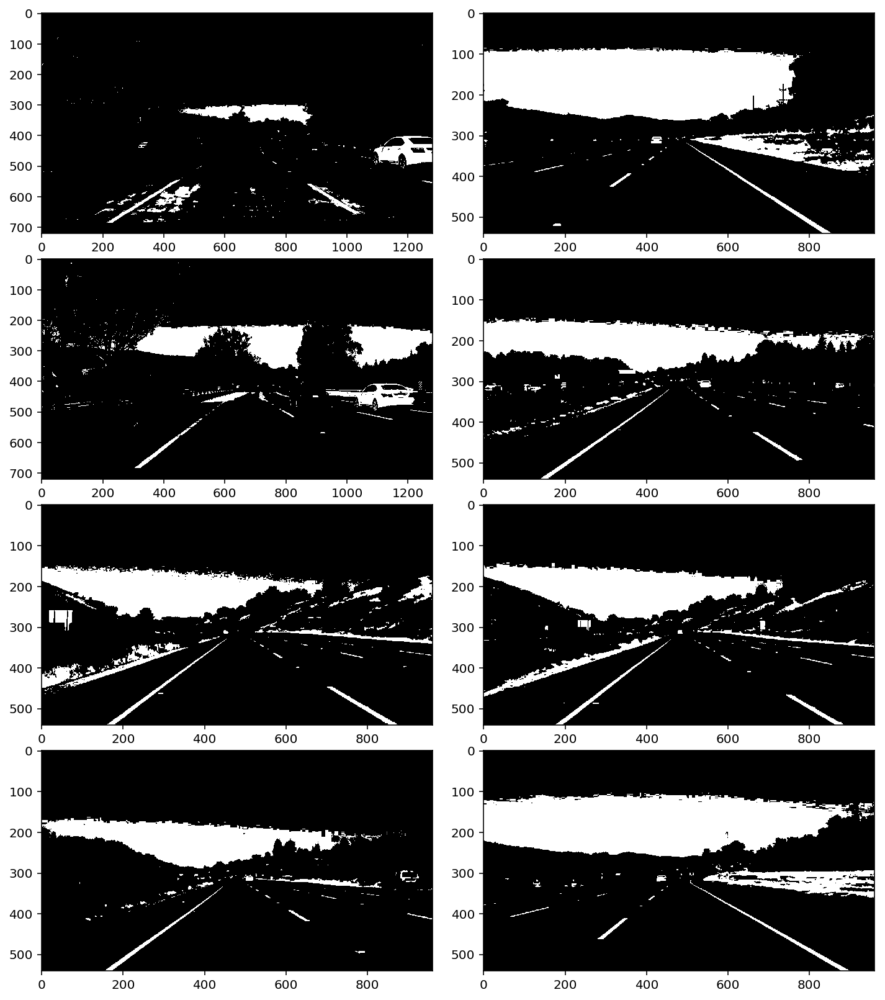

In [11]:
# We need to select from the image the white colored areas.
# Therefore we use the following thresholds.
low_col_thr = 170
high_col_thr = 255

col_sel_img_list = [cv2.inRange(img,low_col_thr,high_col_thr) for img in gray_img_list]
display(col_sel_img_list)

## Evaluation of the result

<p>At first glance the implication of this filtering is that on the *easy* images the result is good. But I had some trouble identifying the lanes on the *challenging* images. On my first exercise iteration I continued until the end and found out that using this color space and color selection can produce decent results on the first two videos.</p>
<p>The problem arouse when I tried to run my pipeline on the `challenge` video though. The pipeline was unable to identify a satifsying number of decent hough lines because the edges were a obscure. I realised that in order to make it work I had to do more than this.</p>

## Using HLS

<p>With a little bit of internet research I learnt about another colorspace which can be useful on this situation. The [HSL or HLS](https://en.wikipedia.org/wiki/HSL_and_HSV). It was a common practice also for detecting different color lines in other projects so it was worth a try.</p>
<p>OpenCV seems to already provide the functionality by just changing the attribute of the `cvtColor` to `cv2.COLOR_RGB2HLS`

<p>The result as it can be seen below is indeed better because both the **`white`** and the **`yellow`** lines are pretty clear and can be extracted

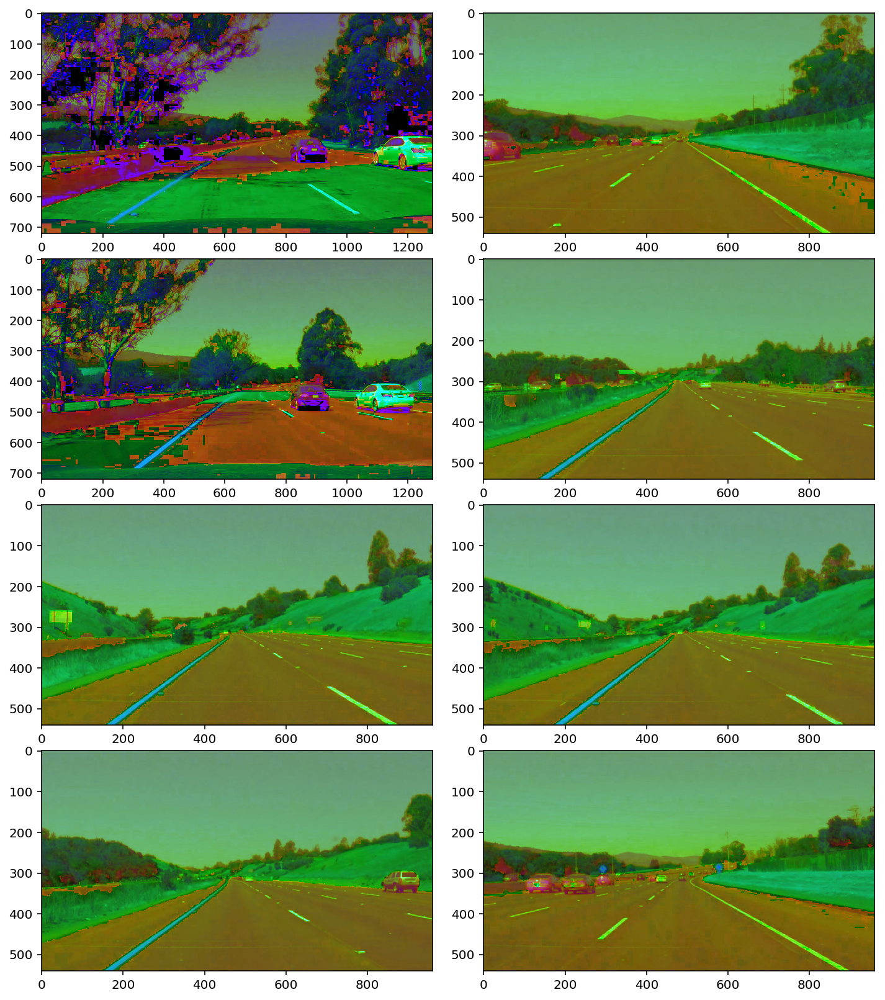

In [15]:
def hls(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2HLS)

hls_img_list = list(map(hls, img_list))
display(hls_img_list)

## Color Selection (part 2)

<p>After a little bit of research about the coordinates of **HLS** (`Hue`,`Light` and `Saturation`) and the tool provided in [this](http://colorizer.org/) website I picked the required color levels for my color selection.</p>
<p>The results are much better than the color selection after grayscale I had above.</p>

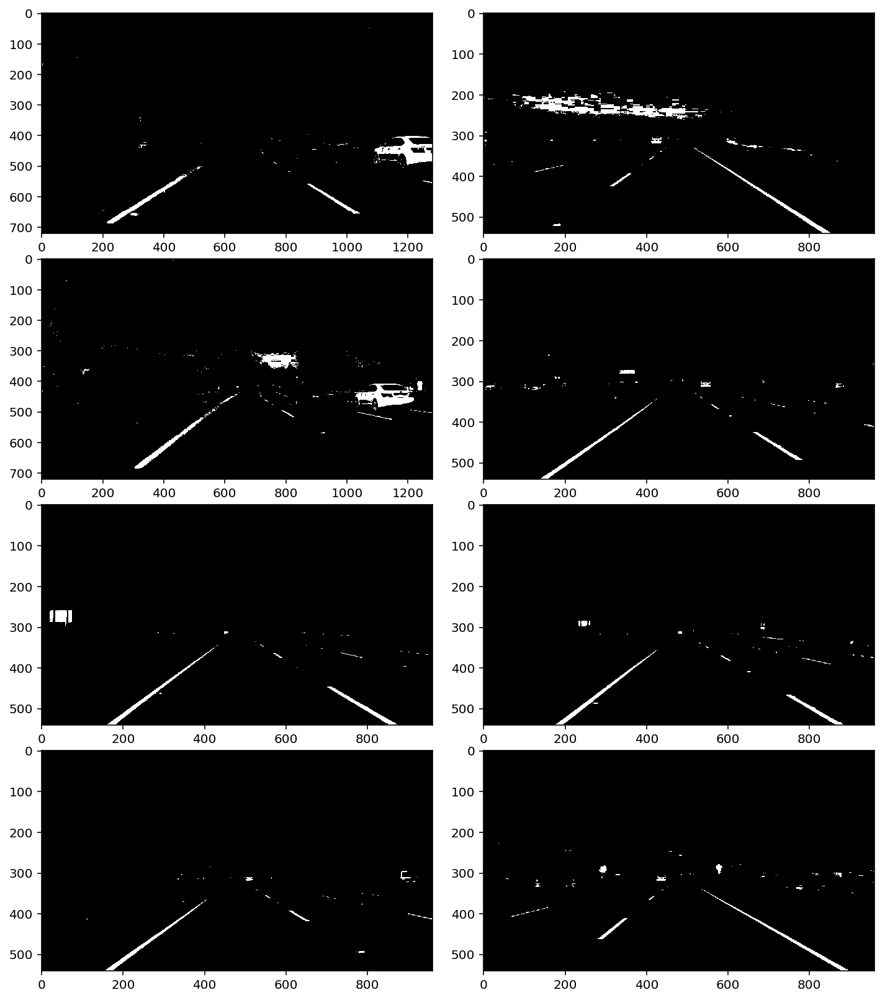

In [23]:
def line_colors(img):
    
    #yellow                  H   L   S
    yellow_l_thr = np.array([10, 50,110],dtype = np.uint8)
    yellow_h_thr = np.array([50,255,255],dtype = np.uint8)
    
    #white                   H   L   S
    white_l_thr = np.array([  0,200,  0],dtype = np.uint8)
    white_h_thr = np.array([255,255,255],dtype = np.uint8)
    
    yellow_img = cv2.inRange(img, yellow_l_thr, yellow_h_thr)
    white_img = cv2.inRange(img, white_l_thr, white_h_thr)
    
    return cv2.bitwise_or(white_img, yellow_img)
    
col_sel_img_list = list(map(line_colors, hls_img_list))

display(col_sel_img_list)

## Apply Gaussian blurring and Canny algorithm for edge detection
The result from the color selection now seems to be acceptable. For the next step I used the `gaussian_blur` function and then detect the edges with `canny`. 
* The kernel size shall be a positive odd number `(1,2,3,...,2k+1)`. 
* The threshold ratio for the Canny edge detection algorithm shall be an `1:2` to `1:3` `low_threshold` vs `high threshold`.

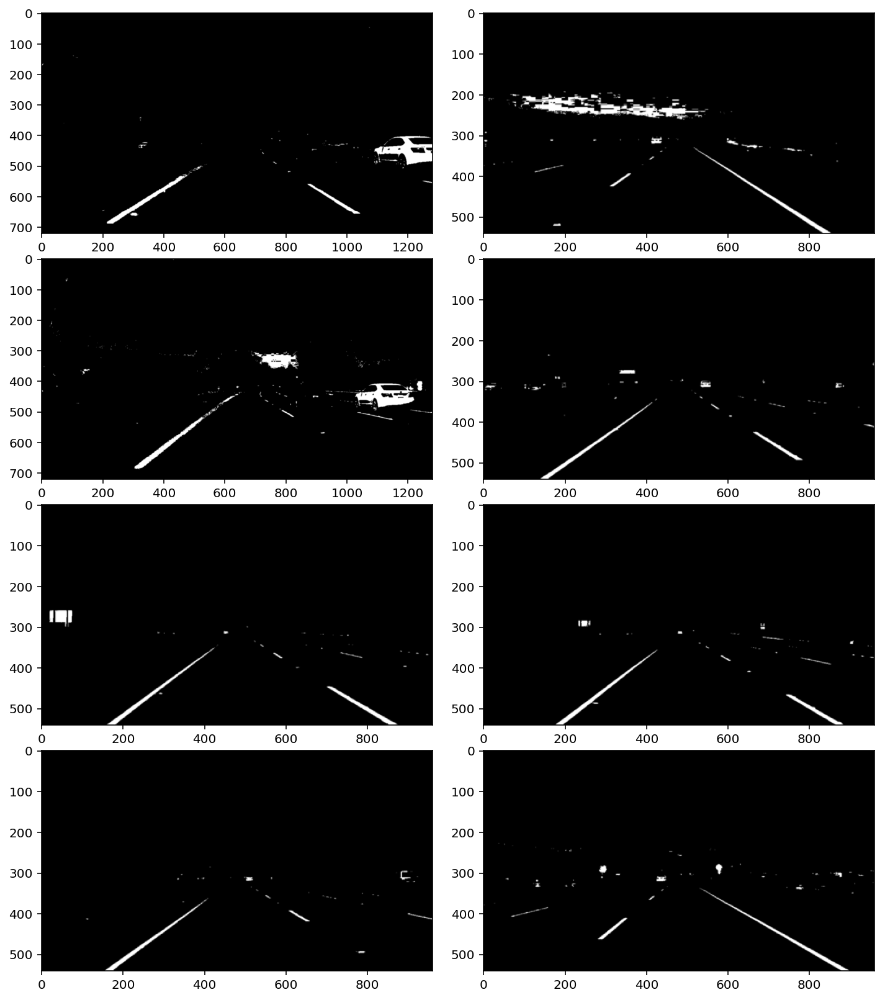

In [25]:
# Kernel size parameter for gaussian blur function
kernel_size = 5

blur_img_list = [gaussian_blur(img, kernel_size) for img in col_sel_img_list]
display(blur_img_list)


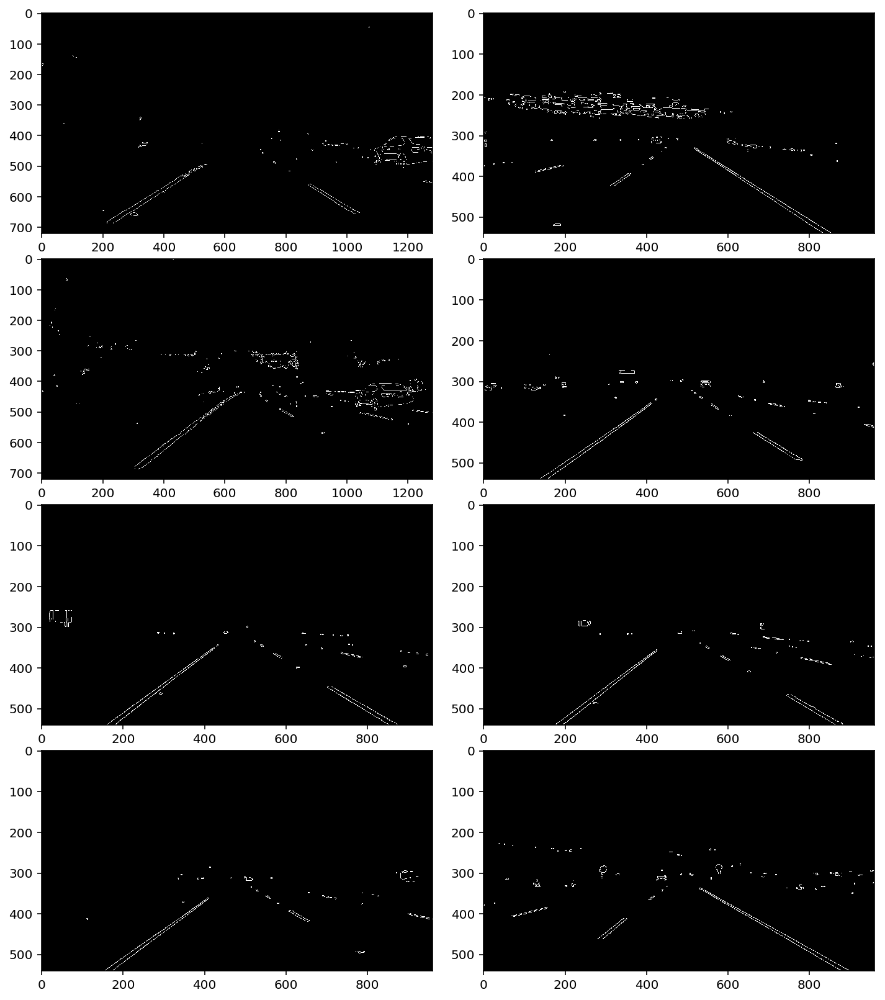

In [26]:
# Low and high threshold parameters for canny function
l_canny_thr = 50
h_canny_thr = 130

edge_img_list = [canny(img,l_canny_thr,h_canny_thr) for img in blur_img_list]
display(edge_img_list)

## Region of interest
Next step is to apply a region of interest. At fist I used one array of `vertices` for all images. I realised that was a **bad** idea as the `challenge` video reminded me that not all the videos and images have the same **resolution**. So I refurbished a little bit my code by implementing a function which given the input image `img`
defines vertices proportional to the size of `x` and `y` of the image. This takes for granted that the camera on the car is mounted on the *"same"* spot

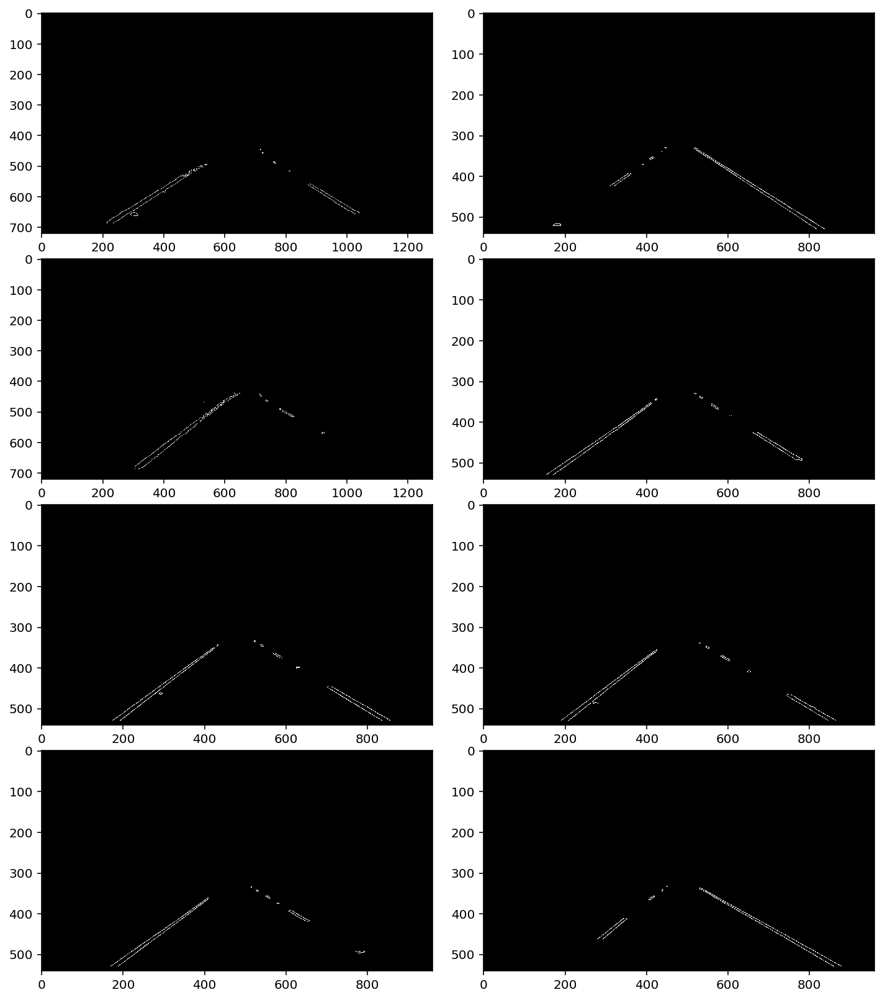

In [28]:
def roi_vertices(img):
    """
    The function is getting the input image `img`
    and defines the vertices of the region of interest
    based on coefficients
    """
    imshape = img.shape
    y = imshape[0]
    x = imshape[1]
    bl = [int(x*0.1) ,int(y*0.98)]
    br = [int(x*0.96),int(y*0.98)]
    tr = [int(x*0.58),int(y*0.61)]
    tl = [int(x*0.45),int(y*0.61)]
    return np.array([[bl,br,tr,tl]],dtype=np.int32)


# The array with the vertices defining the region of interest
masked_img_list = [region_of_interest(img,roi_vertices(img)) for img in edge_img_list]


display(masked_img_list)


## Apply Hough lines algorithm
Next step is to apply Hough lines algorithm. I also save the results as new images with the suffix **`raw`**. So I can check them on my `test_images_output` folder

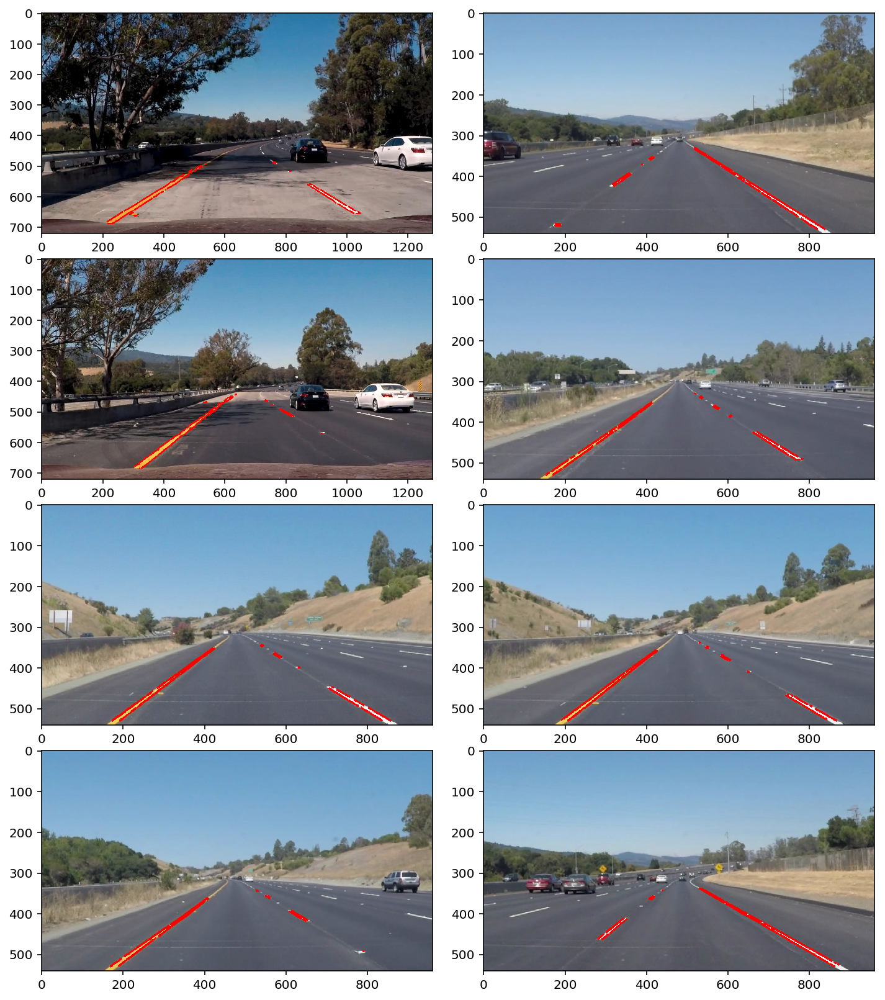

In [30]:
def draw_hough_lines(img, rho = 1, theta = np.pi/180, threshold = 15, min_line_len = 5, max_line_gap = 2):
    return cv2.HoughLinesP(img,rho,theta,threshold,min_line_len,max_line_gap)

line_list = list(map(draw_hough_lines, masked_img_list))

output_raw_img_list = list(map(np.copy, img_list))
for img, lines in zip(output_raw_img_list, line_list):
    draw_lines(img,lines)

display(output_raw_img_list)

write(output_raw_img_list,output_path,img_name_list, "raw")

## Averaging and extrapolating lines

In order to get similar result as the example given I had to average the sum of the hough lines and then extrapolate the average line based on a given point of the image that made sense defined by the `y` coordinate which is the same as the `y` of the top vertices of the **`ROI`**.

## Averaging slopes and intercepts to a single lanes
In order to average the hough lines I made the following assumptions:

1. According to the hint in order to separate the right lane from the left lane I took into account the `slope`. 
   * If the `slope` is negative then the hough line is belonging to the left lane because the `y` axis is actually reversed in the images. 
   * On the other hand if the `slope` is positive then it belongs to the right lane.
2. Not all `hough lines` worth the same so I had somehow to put an extra coefficient like weight to take into account the slopes and intercepts of the lines that more important. The thinking was the **longer** the line the more important should be. So I actually multiplied the line characteristics (`slope` and `intercept`) with the line `length`. Then for the *average* lanes I divided by the total sum of the lengths.
3. When started video processing one extra *filtering* occured to me reading [this](https://medium.com/@esmat.anis/robust-extrapolation-of-lines-in-video-using-linear-hough-transform-edd39d642ddf). So I added in my averaging function the ability, given the slopes of the lanes of the previous frame and a `tolerance`, to discard **hough lines** which didn't conform to the condition: `abs(slope - avg_slope) < tolerance`. That way I got rid of some jittering of the lanes on my videos occuring because of extreme slopes.

In [45]:
def average_lanes(lines, rslope = None, lslope = None, tolerance = 2):
    """
    The function makes the average of the given hough `lines` and returns
    the `tuple(slope, intercept)` of the average left and right lanes.
    During the evaluation it discards the hough lines which they don't conform
    to the condition `abs(slope-avg_slope)<tolerance`
    """
    
    l_lines = []
    l_lengths = []
    r_lines = []
    r_lengths = []
    
    for line in lines:
        for x1, y1, x2, y2 in line:
            # we don't care for vertical lines
            if x2 == x1:
                continue
            slope = (y2-y1)/(x2-x1)
            intercept = y1 - slope*x1
            length = np.sqrt((x2-x1)**2 + (y2-y1)**2)
            # y2 < y1 because in images the y axis is reversed
            # this means right lane has positive slope 
            if slope > 0:
                if (rslope is None) or (np.fabs(slope - rslope) < tolerance):
                    r_lines.append((slope,intercept))
                    r_lengths.append((length))
            elif slope < 0:
                if (lslope is None) or (np.fabs(slope - lslope) < tolerance):
                    l_lines.append((slope,intercept))
                    l_lengths.append((length))
            else:
                continue
                
    if len(r_lengths) > 0:
        right_lane = np.dot(r_lengths, r_lines)/np.sum(r_lengths)
    else:
        right_lane = None
    if len(l_lines) > 0:
        left_lane = np.dot(l_lengths, l_lines)/np.sum(l_lengths)
    else:
        left_avg_line = None
    return left_lane, right_lane


## Extrapolate lines

Then I defined a helper function which given the `y1` `y2` coordinates for the line points and the `lane` produces the end points of the **extrapolated** line

In [55]:
def extrapolate_line(y1, y2, line):
    """
    The function extrapolates a line to the end points
    defined by their `y1`,`y2` coordinates.
    """
    
    if line is None:
        return None
    
    slope, intercept = line
    
    x1 = int((y1 - intercept) / slope)
    x2 = int((y2 - intercept) / slope)
    return ((x1,y1),(x2,y2))
    
    

## Create and draw lanes helper functions

In [66]:
def lanes(img, lines, rslope = None, lslope = None, tolerance = 2):
    """
    The function returns the lanes for a given image `img`
    and its hough lines
    """
    # Get the average left and right lanes
    right_lane, left_lane = average_lines(lines, rslope, lslope, tolerance)
    # Extract the endpoints y coordinates by the image shame
    y1 = img.shape[0]
    y2 = int(img.shape[0]*0.6)
    # Get the extrapolated lanes
    l_ext_lane = extrapolate_line(y1, y2, left_lane)
    r_ext_lane = extrapolate_line(y1,y2,right_lane)
    return l_ext_lane, r_ext_lane
    

def draw_lanes(img, lanes, color = [255,0,0], thickness = 10):
    """
    The function given the image `img` the `lanes` the line `color`
    and the line `thickness` returns the image with the 
    lanes drawn on top of it
    """
    lane_img = np.zeros_like(img)
    for lane in lanes:
        if lane is not None:
            cv2.line(lane_img, *lane, color, thickness)
    return cv2.addWeighted(img, 1.0, lane_img, 1, 0)


## Test the images

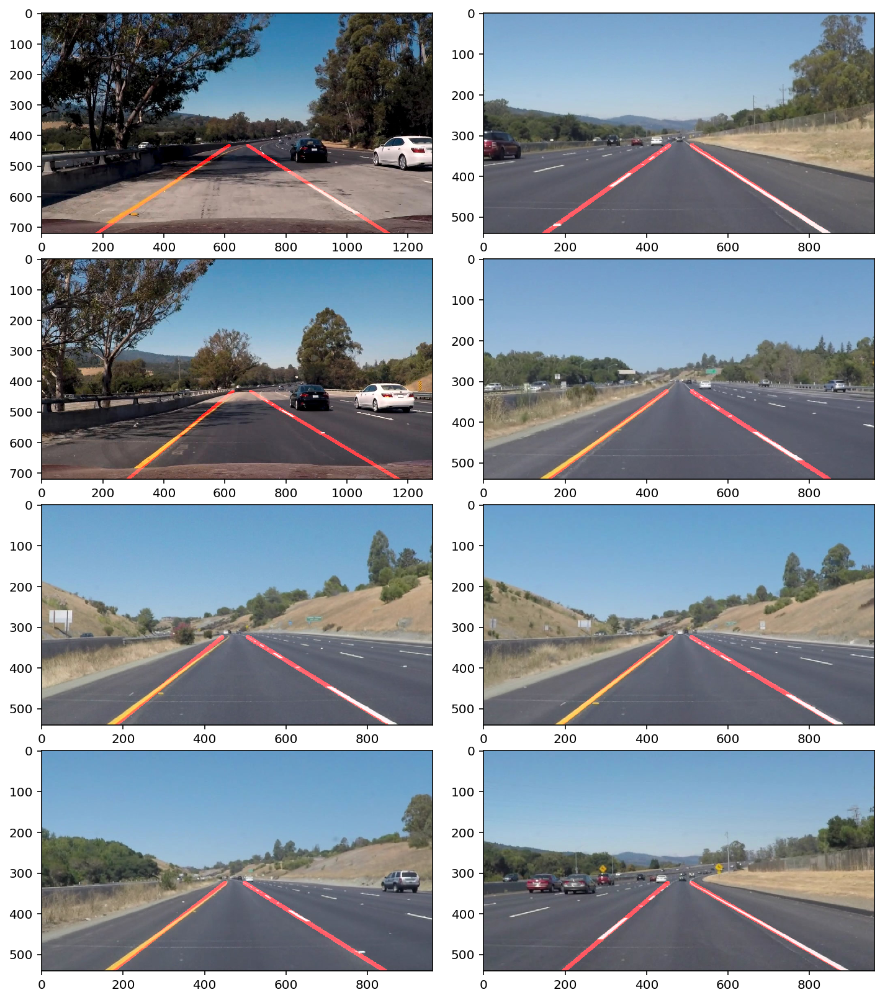

In [67]:
lane_img_list = []

for img, lines in zip(img_list, line_list):
    lane_img_list.append(draw_lanes(img,lanes(img,lines)))
    
display(lane_img_list)

write(lane_img_list,output_path,img_name_list, "final")

## Test on Videos

You know what's cooler than drawing lanes over images? Drawing lanes over video!

We can test our solution on two provided videos:

`solidWhiteRight.mp4`

`solidYellowLeft.mp4`

**Note: if you get an import error when you run the next cell, try changing your kernel (select the Kernel menu above --> Change Kernel). Still have problems? Try relaunching Jupyter Notebook from the terminal prompt. Also, consult the forums for more troubleshooting tips.**

**If you get an error that looks like this:**
```
NeedDownloadError: Need ffmpeg exe. 
You can download it by calling: 
imageio.plugins.ffmpeg.download()
```
**Follow the instructions in the error message and check out [this forum post](https://discussions.udacity.com/t/project-error-of-test-on-videos/274082) for more troubleshooting tips across operating systems.**

In [68]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [77]:
class VideoProcessor:
    
    #Empty lists for slopes and intercepts of the lanes
    left_lanes = []
    right_lanes = []
    rslope = None
    rintercept = None
    lslope = None
    lintercept = None
    # Kernel size parameter for gaussian blur function
    kernel_size = 15
    # Low and high threshold parameters for canny function
    l_canny_thr = 50
    h_canny_thr = 130
    # Parameters for Hough Lines
    rho = 1
    theta = np.pi/270
    threshold = 30
    min_len = 2
    max_gap = 1
    
    # Averaging factors
    # Frame counter for SMA
    frame_cnt = 4
    #Slope tolerance for discarding hough lines
    slope_tolerance = 1.6
        
    def avg_lane(self, lane, prev_lanes):
        
        if lane is None:
            lane = prev_lanes[-1]
        
        prev_lanes.append(lane)
        if len(prev_lanes) > 0:
            if len(prev_lanes) > self.frame_cnt:
                prev_lanes.pop(0)
            lane = np.mean(prev_lanes, axis=0, dtype=np.int32)
            lane = tuple(map(tuple,lane))
        return lane
    
    def avg_slope(self, lane):
        
    
        slope = (lane[1][1] - lane[0][1]) / (lane[1][0] - lane[0][0])
        return slope
            

    def process_image(self, image):
        # NOTE: The output you return should be a color image (3 channel) for processing video below
        # TODO: put your pipeline here,
        # you should return the final output (image where lines are drawn on lanes)
        hls_img = hls(image)
        col_sel_img = line_colors(hls_img)
        blur_img = gaussian_blur(col_sel_img, self.kernel_size)
        edge_img = canny(blur_img,self.l_canny_thr,self.h_canny_thr)
        masked_img = region_of_interest(edge_img,roi_vertices(edge_img))
        lines = draw_hough_lines(masked_img, self.rho, self.theta, self.threshold, self.min_len, self.max_gap)
        
        if lines is not None:
            right_lane, left_lane = lanes(image,lines, self.rslope, self.lslope, self.slope_tolerance)
        else:
            left_lane = None
            right_lane = None
        left_lane = self.avg_lane(left_lane, self.left_lanes)
        self.lslope = self.avg_slope(left_lane)
        right_lane = self.avg_lane(right_lane,self.right_lanes)
        self.rslope = self.avg_slope(right_lane)
        result = draw_lanes(image,(left_lane, right_lane))

        return result
    


Let's try the one with the solid white lane on the right first ...

In [78]:
outputpath = "test_videos_output"
if os.path.exists(outputpath)==False:
    os.mkdir(outputpath)
white_output = 'test_videos_output/solidWhiteRight.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
v1Processor = VideoProcessor()
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")#.subclip(5,10)
white_clip = clip1.fl_image(v1Processor.process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:04<00:00, 49.26it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 11 s, sys: 60 ms, total: 11.1 s
Wall time: 4.83 s


Play the video inline, or if you prefer find the video in your filesystem (should be in the same directory) and play it in your video player of choice.

In [73]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Improve the draw_lines() function

**At this point, if you were successful with making the pipeline and tuning parameters, you probably have the Hough line segments drawn onto the road, but what about identifying the full extent of the lane and marking it clearly as in the example video (P1_example.mp4)?  Think about defining a line to run the full length of the visible lane based on the line segments you identified with the Hough Transform. As mentioned previously, try to average and/or extrapolate the line segments you've detected to map out the full extent of the lane lines. You can see an example of the result you're going for in the video "P1_example.mp4".**

**Go back and modify your draw_lines function accordingly and try re-running your pipeline. The new output should draw a single, solid line over the left lane line and a single, solid line over the right lane line. The lines should start from the bottom of the image and extend out to the top of the region of interest.**

Now for the one with the solid yellow lane on the left. This one's more tricky!

In [ ]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4').subclip(0,5)
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')#.subclip(5,10)
v2Processor = VideoProcessor()
yellow_clip = clip2.fl_image(v2Processor.process_image)
%time yellow_clip.write_videofile(yellow_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">test_videos/challenge.mp4test_videos/challenge.mp4
</video>
""".format(yellow_output))

## Writeup and Submission

If you're satisfied with your video outputs, it's time to make the report writeup in a pdf or markdown file. Once you have this Ipython notebook ready along with the writeup, it's time to submit for review! Here is a [link](https://github.com/udacity/CarND-LaneLines-P1/blob/master/writeup_template.md) to the writeup template file.


## Optional Challenge

Try your lane finding pipeline on the video below.  Does it still work?  Can you figure out a way to make it more robust?  If you're up for the challenge, modify your pipeline so it works with this video and submit it along with the rest of your project!

In [ ]:
challenge_output = 'test_videos_output/challenge.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip3 = VideoFileClip('test_videos/challenge.mp4').subclip(0,5)
clip3 = VideoFileClip('test_videos/challenge.mp4')#.subclip(5,10)
v3Processor = VideoProcessor()
challenge_clip = clip3.fl_image(v3Processor.process_image)
%time challenge_clip.write_videofile(challenge_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))